# Image Classification of Lung and Colon Cancer Histopathological Images

## About the Data

This dataset contains 25,000 histopathological images with 5 classes. All images are 768 x 768 pixels in size and are in jpeg file format.
The images were generated from an original sample of HIPAA compliant and validated sources, consisting of 750 total images of lung tissue (250 benign lung tissue, 250 lung adenocarcinomas, and 250 lung squamous cell carcinomas) and 500 total images of colon tissue (250 benign colon tissue and 250 colon adenocarcinomas) and augmented to 25,000 using the Augmentor package.



There are five classes in the dataset, each with 5,000 images, being:

Lung benign tissue

Lung adenocarcinoma

Lung squamous cell carcinoma

Colon adenocarcinoma

Colon benign tissue

## Task

The task is to develop a image classification model to accurately predict between the five classes for lung and colon tissue.

Such models can be used to identify potential cancers early on, critical for successful cancer treatment. In addition, we would be able to provide accurate diagnosis of different types of cancer which would require different and more accurate treatment methods. Further, with early and accurate detection we could reduce healthcare costs in the long term.

## Packages

In [169]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import shutil

from random import shuffle

from PIL import Image

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.optimizers import SGD

from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, MaxPool2D, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras.optimizers import Adam
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from keras.models import Model
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from keras.regularizers import l2

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.utils import class_weight
from sklearn.metrics import ConfusionMatrixDisplay

from umap import UMAP
import umap.umap_ as umap


## Creating Test, Train, and Validation set

lung_colon = "/Users/desgi/Documents/P_ML/lung_colon_image_set/All_sets"
train_directory = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Train" 
validation_directory = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Validation" 
test_directory = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Test"



train_percent = 0.8
validation_percent = 0.1
test_percent = 0.1

lung_col_types = os.listdir(lung_colon)
files = [f for f in lung_col_types if not f.startswith('.')]
for category in files:
    os.makedirs(os.path.join(train_directory, category))
    os.makedirs(os.path.join(validation_directory, category))
    os.makedirs(os.path.join(test_directory, category))
    


for category in files:
    category_directory = os.path.join(lung_colon, category)
    images = os.listdir(category_directory)
    num_images = len(images)
    num_train = len(images)
    num_train_images = int(num_images * train_percent)
    num_validation_images = int(num_images * validation_percent)
    num_test_images = num_images - num_train_images - num_validation_images
    
    random.shuffle(images)
    
    train_images = images[:num_train_images]
    validation_images = images[num_train_images:num_train_images+num_validation_images]
    test_images = images[num_train_images+num_validation_images:]
    
    for image in train_images:
        source = os.path.join(category_directory, image)
        destination = os.path.join(train_directory, category, image)
        shutil.copyfile(source, destination)
    for image in validation_images:
        source = os.path.join(category_directory, image)
        destination = os.path.join(validation_directory, category, image)
        shutil.copyfile(source, destination)
    for image in test_images:
        source = os.path.join(category_directory, image)
        destination = os.path.join(test_directory, category, image)
        shutil.copyfile(source, destination)


print("Number of images in the training set: " + str(len(train_images)))
print("Number of images in the validation set: " +str(len(validation_images)))
print("Number of images in the test set: " + str(len(test_images)))

In [2]:
class_labels = {
    "colon_aca": 0,
    "colon_n" : 1,
    "lung_aca" : 2,
    "lung_n" : 3,
    "lung_scc" : 4
}

In [3]:
train_path = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Train"
val_path = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Validation"
test_path = "/Users/desgi/Documents/P_ML/lung_colon_image_set/Test"

In [4]:
img_size = [224, 224]
num_channels = 3

train_images = []
train_labels = []

for class_label, class_name in class_labels.items():
    class_path = os.path.join(train_path, class_label)
    for filename in os.listdir(class_path):
        img_path = os.path.join(class_path, filename)
        img = Image.open(img_path)
        img = img.resize(img_size)
        img_array = np.array(img)
        train_images.append(img_array)
        train_labels.append(class_name)

In [5]:
train_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size = img_size,
    color_mode = 'rgb',
    batch_size = 64,
    class_mode = 'categorical',
    shuffle = True)

train_images, train_labels = train_generator.next()


Found 24999 images belonging to 5 classes.


val_images = []
val_labels = []

for class_label, class_name in class_labels.items():
    class_path = os.path.join(train_path, class_label)
    for filename in os.listdir(class_path):
        img_path = os.path.join(class_path, filename)
        img = Image.open(img_path)
        img = img.resize(img_size)
        img_array = np.array(img)
        val_images.append(img_array)
        val_labels.append(class_name)

In [6]:
val_datagen = ImageDataGenerator(rescale = 1./255)

val_generator = val_datagen.flow_from_directory(
    val_path,
    target_size = img_size,
    color_mode = 'rgb',
    batch_size = 64,
    class_mode = 'categorical',
    shuffle = True)

val_images, val_labels = val_generator.next()


Found 11734 images belonging to 5 classes.


test_images = []
test_labels = []

for class_label, class_name in class_labels.items():
    class_path = os.path.join(train_path, class_label)
    for filename in os.listdir(class_path):
        img_path = os.path.join(class_path, filename)
        img = Image.open(img_path)
        img = img.resize(img_size)
        img_array = np.array(img)
        test_images.append(img_array)
        test_labels.append(class_name)

In [7]:
test_datagen = ImageDataGenerator(rescale = 1./255)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size = img_size,
    color_mode = 'rgb',
    batch_size = 64,
    class_mode = 'categorical',
    shuffle = True)

test_images, test_labels = test_generator.next()


Found 11657 images belonging to 5 classes.


In [8]:
train_images = np.array(train_images)
train_labels = np.array(train_labels)

val_images = np.array(val_images)
val_labels = np.array(val_labels)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

## Data Visualization

In [9]:
class_labels_inv = {v: k for k, v in class_labels.items()}

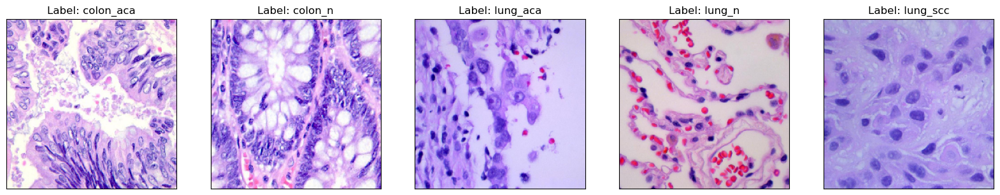

In [10]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4))

for i, (class_name, class_index) in enumerate(class_labels.items()):
    image_index = np.where(np.argmax(train_labels, axis=1) == class_index)[0][0]

    axes[i].imshow(train_images[image_index], cmap='gray')
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    axes[i].set_title(f"Label: {class_name}")

## Data Preprocessing

In [11]:
train_images = train_images.reshape(train_images.shape[0], 224, 224, num_channels)
test_images = test_images.reshape(test_images.shape[0], 224, 224, num_channels)
val_images = val_images.reshape(val_images.shape[0], 224, 224, num_channels)

In [12]:
print(train_labels.shape)
print(test_labels.shape)
print(val_labels.shape)

(64, 5)
(64, 5)
(64, 5)


train_labels = to_categorical(train_labels, 5)
test_labels = to_categorical(test_labels, 5)
val_labels = to_categorical(val_labels, 5 )

In [13]:
print(train_labels.shape)
print(test_labels.shape)
print(val_labels.shape)


(64, 5)
(64, 5)
(64, 5)


In [14]:
scaler = MinMaxScaler()
train_images = scaler.fit_transform(train_images.reshape(train_images.shape[0], -1))
test_images = scaler.transform(test_images.reshape(test_images.shape[0], -1))
val_images = scaler.transform(val_images.reshape(val_images.shape[0], -1))

In [15]:
train_images = train_images.reshape(train_images.shape[0], 224, 224, num_channels)
test_images = test_images.reshape(test_images.shape[0], 224, 224, num_channels)
val_images = val_images.reshape(val_images.shape[0], 224, 224, num_channels)

In [16]:
X_train = np.array(train_images)
y_train = np.array(train_labels)

X_val = np.array(val_images)
y_val = np.array(val_labels)

X_test = np.array(test_images)
y_test = np.array(test_labels)

In [17]:
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(64, 5)
(64, 5)
(64, 5)
(64, 224, 224, 3)
(64, 224, 224, 3)
(64, 224, 224, 3)


In [18]:
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(64, 5)
(64, 5)
(64, 5)


group_1_train = np.zeros_like(y_train)
group_1_train[np.isin(y_train, [1, 2, 3])] = 1

group_2_train = np.zeros_like(y_train)
group_2_train[np.isin(y_train, [4, 5])] = 1

group_1_val = np.zeros_like(y_val)
group_1_val[np.isin(y_val, [1, 2, 3])] = 1

group_2_val = np.zeros_like(y_val)
group_2_val[np.isin(y_val, [4, 5])] = 1

group_1_test = np.zeros_like(y_test)
group_1_test[np.isin(y_test, [1, 2, 3])] = 1

group_2_test = np.zeros_like(y_test)
group_2_test[np.isin(y_test, [4, 5])] = 1

## Data Augmentation

Since the photos have already undergone data augmentation, I have chosen to refrain from additional augmentation of the images.

## Model Training

model_cnn = Sequential()
model_cnn.add(Conv2D(32,3,padding="same", activation="relu", input_shape=(224,224,3), kernel_regularizer=l2(0.1)))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(32, 3, padding="same", activation="relu", kernel_regularizer=l2(0.1)))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(64, 3, padding="same", activation="relu", kernel_regularizer=l2(0.1)))
model_cnn.add(MaxPool2D())
model_cnn.add(Dropout(0.5))

model_cnn.add(Flatten())
model_cnn.add(Dense(128,activation="relu", kernel_regularizer=l2(0.1)))
model_cnn.add(Dense(5, activation="softmax", kernel_regularizer=l2(0.1)))


2nd model cnn - transfer learning

def train_model(lr, dropout_rate, num_filters, kernel_size):
    model = Sequential()

    # Add the first convolutional layer separately to set the input_shape
    model.add(Conv2D(num_filters[0], (kernel_size, kernel_size), padding="same", activation="relu", input_shape=(224, 224, 3), kernel_initializer='he_normal'))
    model.add(MaxPool2D())

    # Add the remaining convolutional layers
    for nf in num_filters[1:]:
        model.add(Conv2D(nf, (kernel_size, kernel_size), padding="same", activation="relu", kernel_initializer='he_normal'))
        model.add(MaxPool2D())

    model.add(Flatten())
    model.add(Dense(256, activation="relu", kernel_regularizer=l2(0.01), kernel_initializer='he_normal'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.01), kernel_initializer='he_normal'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(5, activation="softmax"))

    opt = Adam(learning_rate=lr)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    early_stop = EarlyStopping(monitor='val_loss', patience=5)

    history = model.fit(X_train, y_train, epochs=150, batch_size=64, validation_data=(X_val, y_val), callbacks=[early_stop])

    return history


n_iter = 20

best_val_acc = 0
best_hyperparams = None

for i in range(n_iter):
    lr = 10 ** np.random.uniform(-5, -3)
    dropout_rate = np.random.uniform(0.2, 0.6)
    num_filters = [2 ** np.random.randint(4, 8) for _ in range(np.random.randint(3, 6))]
    kernel_size = np.random.choice([3, 5])

    history = train_model(lr, dropout_rate, num_filters, kernel_size)
    val_acc = np.max(history.history['val_accuracy'])

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_hyperparams = {'lr': lr, 'dropout_rate': dropout_rate, 'num_filters': num_filters, 'kernel_size': kernel_size}

    print(f"Iteration {i+1}/{n_iter} - Val Accuracy: {val_acc:.4f} - Hyperparameters: {lr:.5f}, {dropout_rate:.2f}, {num_filters}, {kernel_size}")

print("Best validation accuracy:", best_val_acc)
print("Best hyperparameters:", best_hyperparams)

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.plot(loss, label='Train', color='red')
plt.plot(val_loss, label='Validation', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Loss', fontsize=12)
plt.title('Training & Validation Loss', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

plt.figure(figsize=(8, 8))
plt.plot(acc, label='Train', color='red')
plt.plot(val_acc, label='Validation', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Training & Validation Accuracy', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

1st model cnn - no transfer learning

In [ ]:
model_cnn = Sequential()

model_cnn.add(Conv2D(32, 3, padding="same", activation="relu", input_shape=(224,224,3), kernel_initializer='he_normal'))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(16, 3, padding="same", activation="relu", kernel_initializer='he_normal'))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(16, 3, padding="same", activation="relu", kernel_initializer='he_normal'))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(16, 3, padding="same", activation="relu", kernel_initializer='he_normal'))
model_cnn.add(MaxPool2D())

model_cnn.add(Conv2D(16, 3, padding="same", activation="relu", kernel_initializer='he_normal'))
model_cnn.add(MaxPool2D())

model_cnn.add(Flatten())
model_cnn.add(Dense(256, activation="relu", kernel_regularizer=l2(0.01), kernel_initializer='he_normal'))
model_cnn.add(Dropout(0.35))
model_cnn.add(Dense(128, activation="relu", kernel_regularizer=l2(0.01), kernel_initializer='he_normal'))
model_cnn.add(Dropout(0.35))
model_cnn.add(Dense(5, activation="softmax"))

In [ ]:
lr = 0.0004

opt = Adam(learning_rate=lr)

model_cnn.compile(optimizer = opt,
                 loss = 'categorical_crossentropy',
                 metrics = ['accuracy'])

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
history = model_cnn.fit(X_train, y_train,
                       epochs = 50,
                       batch_size = 64,
                       validation_data = (X_val, y_val),
                       callbacks = [early_stop])

In [19]:
#EfficientNetB0
import efficientnet.tfkeras as efn

base_model = efn.EfficientNetB0(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(5, activation='softmax')(x)
 
model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

2023-06-06 02:12:29.840419: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
history = model.fit(
    train_generator,
    epochs=2,
    validation_data=val_generator,
)

In [20]:
history = model.fit(
    train_generator,
    epochs=2,
    validation_data=test_generator,
)

Epoch 1/2
391/391 [==============================] - 1008s 3s/step - loss: 0.7317 - accuracy: 0.9140 - val_loss: 0.0810 - val_accuracy: 0.9702
Epoch 2/2
391/391 [==============================] - 1037s 3s/step - loss: 0.1425 - accuracy: 0.9487 - val_loss: 0.0409 - val_accuracy: 0.9842


In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

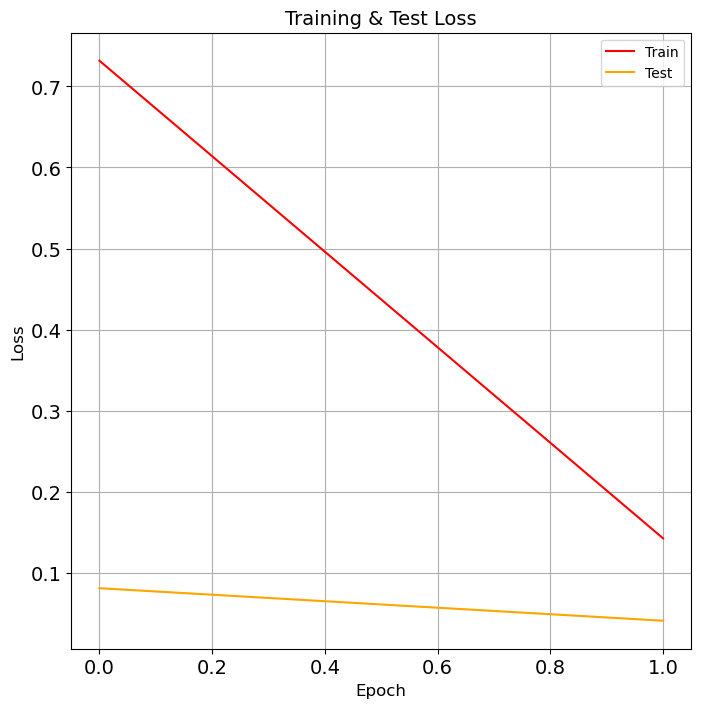

In [277]:
plt.figure(figsize=(8, 8))
plt.plot(loss, label='Train', color='red')
plt.plot(val_loss, label='Test', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Loss', fontsize=12)
plt.title('Training & Test Loss', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

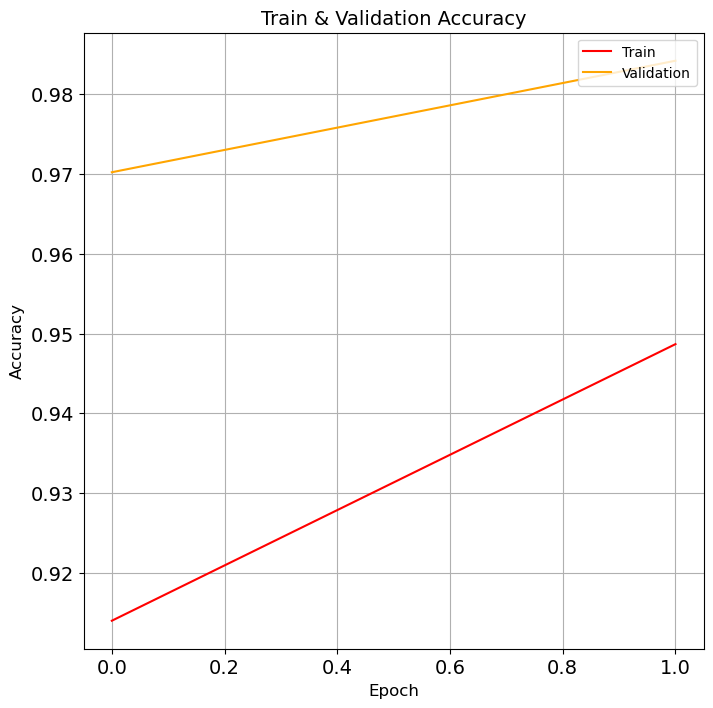

In [278]:
plt.figure(figsize=(8, 8))
plt.plot(acc, label='Train', color='red')
plt.plot(val_acc, label='Validation', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Train & Validation Accuracy', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

In [ ]:
#Confusion Matrix - Sequential
y_pred_probs = model_cnn.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test,axis=1)
y_val_true = np.argmax(y_val, axis=1)

cm=confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay.from_predictions(y_true,y_pred)
print(cm)

2/2 [==============================] - 3s 803ms/step
[[14  0  0  0  0]
 [ 0 14  0  0  0]
 [ 3  0  7  0  0]
 [ 1  0  1 10  0]
 [ 0  0  1  0 13]]


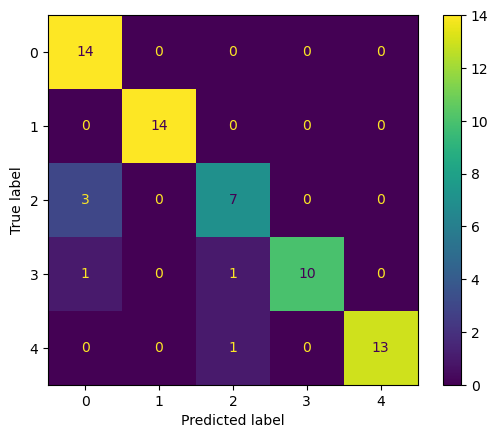

In [24]:
#Confusion Matrix - EfficientNetB0
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test,axis=1)
y_val_true = np.argmax(y_val, axis=1)

cm=confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay.from_predictions(y_true,y_pred)
print(cm)

In [ ]:
#Sequential
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy}")

precision = precision_score(y_true, y_pred, average='macro')
print(f"Precision (macro average): {precision}")

recall = recall_score(y_true, y_pred, average='macro')
print(f"Recall (macro average): {recall}")

f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1-score (macro average): {f1}")

In [25]:
#Efficient
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy}")

precision = precision_score(y_true, y_pred, average='macro')
print(f"Precision (macro average): {precision}")

recall = recall_score(y_true, y_pred, average='macro')
print(f"Recall (macro average): {recall}")

f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1-score (macro average): {f1}")

Accuracy: 0.90625
Precision (macro average): 0.9111111111111111
Recall (macro average): 0.8923809523809524
F1-score (macro average): 0.8967791954634059


In [26]:
for layer in model.layers:
    print(layer.name)
    
#Grad_CAM = top_conv
#PCA/UMAP = flatten

input_1
stem_conv
stem_bn
stem_activation
block1a_dwconv
block1a_bn
block1a_activation
block1a_se_squeeze
block1a_se_reshape
block1a_se_reduce
block1a_se_expand
block1a_se_excite
block1a_project_conv
block1a_project_bn
block2a_expand_conv
block2a_expand_bn
block2a_expand_activation
block2a_dwconv
block2a_bn
block2a_activation
block2a_se_squeeze
block2a_se_reshape
block2a_se_reduce
block2a_se_expand
block2a_se_excite
block2a_project_conv
block2a_project_bn
block2b_expand_conv
block2b_expand_bn
block2b_expand_activation
block2b_dwconv
block2b_bn
block2b_activation
block2b_se_squeeze
block2b_se_reshape
block2b_se_reduce
block2b_se_expand
block2b_se_excite
block2b_project_conv
block2b_project_bn
block2b_drop
block2b_add
block3a_expand_conv
block3a_expand_bn
block3a_expand_activation
block3a_dwconv
block3a_bn
block3a_activation
block3a_se_squeeze
block3a_se_reshape
block3a_se_reduce
block3a_se_expand
block3a_se_excite
block3a_project_conv
block3a_project_bn
block3b_expand_conv
block3b_expan

## Evaluation Results

In [ ]:
history = model_cnn.fit(X_train, y_train,
                       epochs = 50,
                       batch_size = 64,
                       validation_data = (X_test, y_test),
                       callbacks = [early_stop])

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(loss, label='Train', color='red')
plt.plot(val_loss, label='Test', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Loss', fontsize=12)
plt.title('Training & Test Loss', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(acc, label='Train', color='red')
plt.plot(val_acc, label='Test', color='orange')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=10)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Training & Test Accuracy', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.grid()
plt.show()

In [ ]:
y_pred_probs = model_cnn.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test,axis=1)
y_val_true = np.argmax(y_val, axis=1)

cm=confusion_matrix(y_true, y_pred)
ConfusionMatrixDisplay.from_predictions(y_true,y_pred)
print(cm)

In [ ]:
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy}")

precision = precision_score(y_true, y_pred, average='macro')
print(f"Precision (macro average): {precision}")

recall = recall_score(y_true, y_pred, average='macro')
print(f"Recall (macro average): {recall}")

f1 = f1_score(y_true, y_pred, average='macro')
print(f"F1-score (macro average): {f1}")

Implementing Grad-CAM algorithm to visualizae important regions in an image for a specific class

In [29]:
def grad_cam(model, image, target_class, last_conv_layer_name):

    image_array = np.expand_dims(image, axis=0)

    target_class_idx = np.argmax(target_class)
    
    # Get the output of the model for the given image
    predictions = model(image_array)
    target = predictions[:, target_class_idx]
    
    # Get the gradients of the target class with respect to the last convolutional layer
    with tf.GradientTape() as tape:
        last_conv_layer = model.get_layer(last_conv_layer_name)
        iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
        model_out, last_conv_layer_output = iterate(image_array)
        target = model_out[:, target_class_idx]
        tape.watch(last_conv_layer_output)
        grads = tape.gradient(target, last_conv_layer_output)
    
    # Compute the channel-wise mean of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Compute the Grad-CAM heatmap
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, last_conv_layer_output), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    heatmap = heatmap.numpy()
    
    # Resize and normalize the heatmap
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    
    # Apply the heatmap to the original image
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    image = image.astype(np.uint8)
    superimposed_img = cv2.addWeighted(image, 0.7, heatmap, 0.3, 0)

    return superimposed_img, heatmap

## Colon N: Class 2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

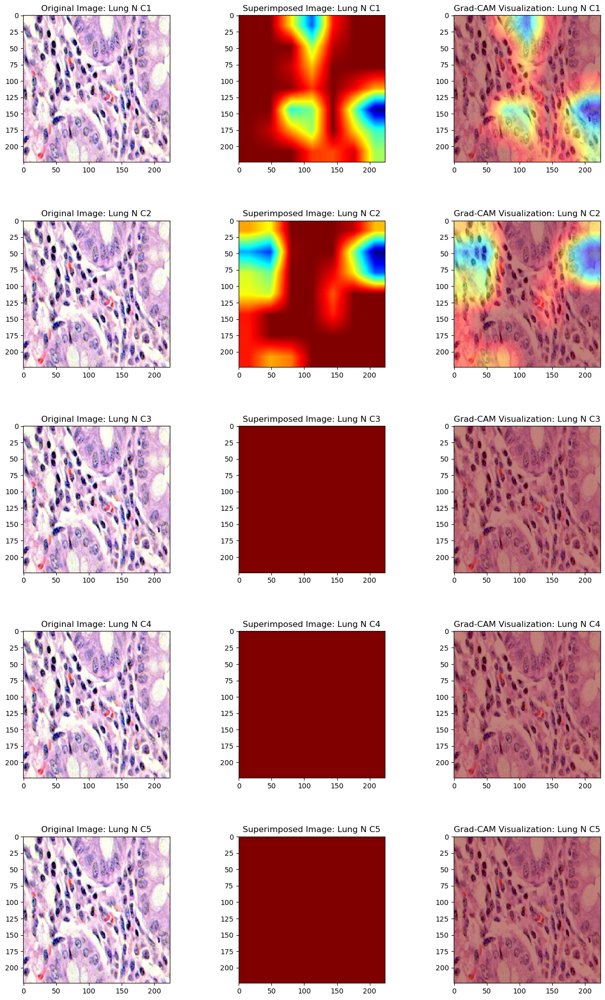

In [42]:
#We will be using the EfficientNetB0 model with Grad-CAM
#Class 2:
input_image = X_train[7]

target_class_1 = np.array([1,0,0,0,0])
target_class_2 = np.array([0,1,0,0,0])
target_class_3 = np.array([0,0,1,0,0])
target_class_4 = np.array([0,0,0,1,0])
target_class_5 = np.array([0,0,0,0,1])

last_conv_layer_name = 'top_conv'

superimposed_img, heatmap = grad_cam(model, input_image, target_class_1, last_conv_layer_name)
superimposed_img2, heatmap2 = grad_cam(model, input_image, target_class_2, last_conv_layer_name)
superimposed_img3, heatmap3 = grad_cam(model, input_image, target_class_3, last_conv_layer_name)
superimposed_img4, heatmap4 = grad_cam(model, input_image, target_class_4, last_conv_layer_name)
superimposed_img5, heatmap5 = grad_cam(model, input_image, target_class_5, last_conv_layer_name)


fig, axes = plt.subplots(5,3,figsize=(15,25))

fig.subplots_adjust(hspace=0.4, wspace=0.4)

axes[0,0].imshow(input_image)
axes[0,0].set_title('Original Image: Lung N C1')

axes[0,1].imshow(heatmap)
axes[0,1].set_title('Superimposed Image: Lung N C1')

axes[0,2].imshow(input_image)
axes[0,2].imshow(heatmap, alpha=0.5, cmap='jet')
axes[0,2].set_title('Grad-CAM Visualization: Lung N C1')

axes[1,0].imshow(input_image)
axes[1,0].set_title('Original Image: Lung N C2')

axes[1,1].imshow(heatmap2)
axes[1,1].set_title('Superimposed Image: Lung N C2')

axes[1,2].imshow(input_image)
axes[1,2].imshow(heatmap2, alpha=0.5, cmap='jet')
axes[1,2].set_title('Grad-CAM Visualization: Lung N C2')

axes[2,0].imshow(input_image)
axes[2,0].set_title('Original Image: Lung N C3')

axes[2,1].imshow(heatmap3)
axes[2,1].set_title('Superimposed Image: Lung N C3')

axes[2,2].imshow(input_image)
axes[2,2].imshow(heatmap3, alpha=0.5, cmap='jet')
axes[2,2].set_title('Grad-CAM Visualization: Lung N C3')

axes[3,0].imshow(input_image)
axes[3,0].set_title('Original Image: Lung N C4')

axes[3,1].imshow(heatmap4)
axes[3,1].set_title('Superimposed Image: Lung N C4')

axes[3,2].imshow(input_image)
axes[3,2].imshow(heatmap4, alpha=0.5, cmap='jet')
axes[3,2].set_title('Grad-CAM Visualization: Lung N C4')

axes[4,0].imshow(input_image)
axes[4,0].set_title('Original Image: Lung N C5')

axes[4,1].imshow(heatmap5)
axes[4,1].set_title('Superimposed Image: Lung N C5')

axes[4,2].imshow(input_image)
axes[4,2].imshow(heatmap5, alpha=0.5, cmap='jet')
axes[4,2].set_title('Grad-CAM Visualization: Lung N C5')

plt.show()

## Lung ACA: Class 3

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

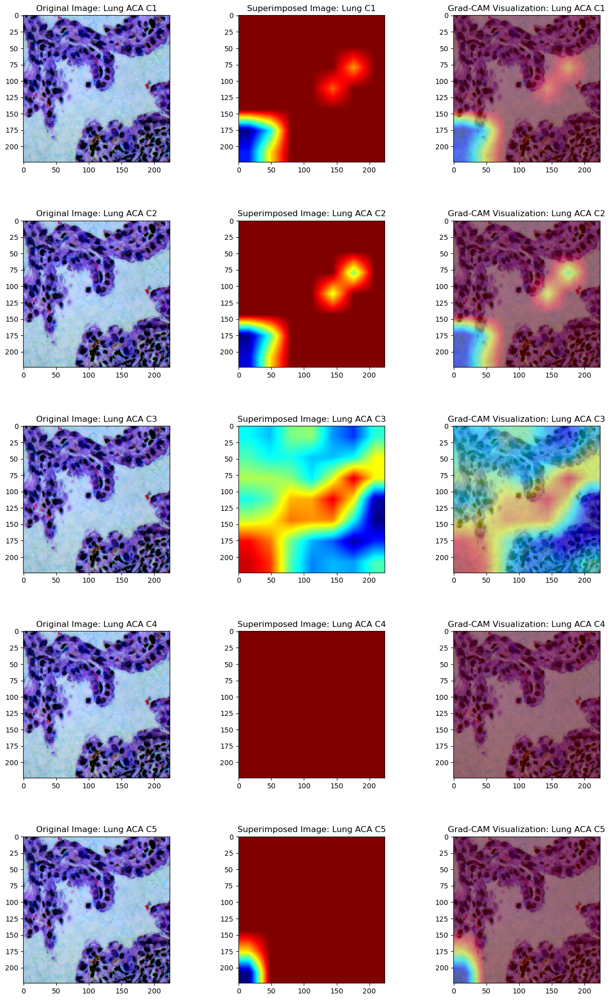

In [43]:
#Class 3:
input_image = X_train[1]

target_class_1 = np.array([1,0,0,0,0])
target_class_2 = np.array([0,1,0,0,0])
target_class_3 = np.array([0,0,1,0,0])
target_class_4 = np.array([0,0,0,1,0])
target_class_5 = np.array([0,0,0,0,1])

last_conv_layer_name = 'top_conv'

superimposed_img, heatmap = grad_cam(model, input_image, target_class_1, last_conv_layer_name)
superimposed_img2, heatmap2 = grad_cam(model, input_image, target_class_2, last_conv_layer_name)
superimposed_img3, heatmap3 = grad_cam(model, input_image, target_class_3, last_conv_layer_name)
superimposed_img4, heatmap4 = grad_cam(model, input_image, target_class_4, last_conv_layer_name)
superimposed_img5, heatmap5 = grad_cam(model, input_image, target_class_5, last_conv_layer_name)


fig, axes = plt.subplots(5,3,figsize=(15,25))

fig.subplots_adjust(hspace=0.4, wspace=0.4)

axes[0,0].imshow(input_image)
axes[0,0].set_title('Original Image: Lung ACA C1')

axes[0,1].imshow(heatmap)
axes[0,1].set_title('Superimposed Image: Lung C1')

axes[0,2].imshow(input_image)
axes[0,2].imshow(heatmap, alpha=0.5, cmap='jet')
axes[0,2].set_title('Grad-CAM Visualization: Lung ACA C1')

axes[1,0].imshow(input_image)
axes[1,0].set_title('Original Image: Lung ACA C2')

axes[1,1].imshow(heatmap2)
axes[1,1].set_title('Superimposed Image: Lung ACA C2')

axes[1,2].imshow(input_image)
axes[1,2].imshow(heatmap2, alpha=0.5, cmap='jet')
axes[1,2].set_title('Grad-CAM Visualization: Lung ACA C2')

axes[2,0].imshow(input_image)
axes[2,0].set_title('Original Image: Lung ACA C3')

axes[2,1].imshow(heatmap3)
axes[2,1].set_title('Superimposed Image: Lung ACA C3')

axes[2,2].imshow(input_image)
axes[2,2].imshow(heatmap3, alpha=0.5, cmap='jet')
axes[2,2].set_title('Grad-CAM Visualization: Lung ACA C3')

axes[3,0].imshow(input_image)
axes[3,0].set_title('Original Image: Lung ACA C4')

axes[3,1].imshow(heatmap4)
axes[3,1].set_title('Superimposed Image: Lung ACA C4')

axes[3,2].imshow(input_image)
axes[3,2].imshow(heatmap4, alpha=0.5, cmap='jet')
axes[3,2].set_title('Grad-CAM Visualization: Lung ACA C4')

axes[4,0].imshow(input_image)
axes[4,0].set_title('Original Image: Lung ACA C5')

axes[4,1].imshow(heatmap5)
axes[4,1].set_title('Superimposed Image: Lung ACA C5')

axes[4,2].imshow(input_image)
axes[4,2].imshow(heatmap5, alpha=0.5, cmap='jet')
axes[4,2].set_title('Grad-CAM Visualization: Lung ACA C5')

plt.show()

## Lung SCC: Class 5

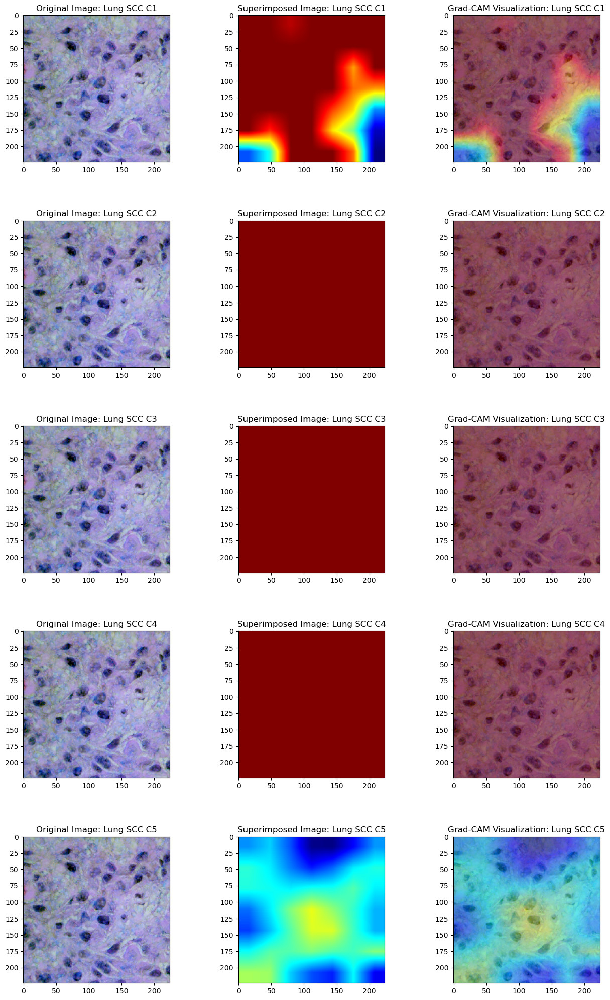

In [36]:
#Class 5:
input_image = X_train[3]

target_class_1 = np.array([1,0,0,0,0])
target_class_2 = np.array([0,1,0,0,0])
target_class_3 = np.array([0,0,1,0,0])
target_class_4 = np.array([0,0,0,1,0])
target_class_5 = np.array([0,0,0,0,1])

last_conv_layer_name = 'top_conv'

superimposed_img, heatmap = grad_cam(model, input_image, target_class_1, last_conv_layer_name)
superimposed_img2, heatmap2 = grad_cam(model, input_image, target_class_2, last_conv_layer_name)
superimposed_img3, heatmap3 = grad_cam(model, input_image, target_class_3, last_conv_layer_name)
superimposed_img4, heatmap4 = grad_cam(model, input_image, target_class_4, last_conv_layer_name)
superimposed_img5, heatmap5 = grad_cam(model, input_image, target_class_5, last_conv_layer_name)


fig, axes = plt.subplots(5,3,figsize=(15,25))

fig.subplots_adjust(hspace=0.4, wspace=0.4)

axes[0,0].imshow(input_image)
axes[0,0].set_title('Original Image: Lung SCC C1')

axes[0,1].imshow(heatmap)
axes[0,1].set_title('Superimposed Image: Lung SCC C1')

axes[0,2].imshow(input_image)
axes[0,2].imshow(heatmap, alpha=0.5, cmap='jet')
axes[0,2].set_title('Grad-CAM Visualization: Lung SCC C1')

axes[1,0].imshow(input_image)
axes[1,0].set_title('Original Image: Lung SCC C2')

axes[1,1].imshow(heatmap2)
axes[1,1].set_title('Superimposed Image: Lung SCC C2')

axes[1,2].imshow(input_image)
axes[1,2].imshow(heatmap2, alpha=0.5, cmap='jet')
axes[1,2].set_title('Grad-CAM Visualization: Lung SCC C2')

axes[2,0].imshow(input_image)
axes[2,0].set_title('Original Image: Lung SCC C3')

axes[2,1].imshow(heatmap3)
axes[2,1].set_title('Superimposed Image: Lung SCC C3')

axes[2,2].imshow(input_image)
axes[2,2].imshow(heatmap3, alpha=0.5, cmap='jet')
axes[2,2].set_title('Grad-CAM Visualization: Lung SCC C3')

axes[3,0].imshow(input_image)
axes[3,0].set_title('Original Image: Lung SCC C4')

axes[3,1].imshow(heatmap4)
axes[3,1].set_title('Superimposed Image: Lung SCC C4')

axes[3,2].imshow(input_image)
axes[3,2].imshow(heatmap4, alpha=0.5, cmap='jet')
axes[3,2].set_title('Grad-CAM Visualization: Lung SCC C4')

axes[4,0].imshow(input_image)
axes[4,0].set_title('Original Image: Lung SCC C5')

axes[4,1].imshow(heatmap5)
axes[4,1].set_title('Superimposed Image: Lung SCC C5')

axes[4,2].imshow(input_image)
axes[4,2].imshow(heatmap5, alpha=0.5, cmap='jet')
axes[4,2].set_title('Grad-CAM Visualization: Lung SCC C5')

plt.show()

## Lung N: Class 4

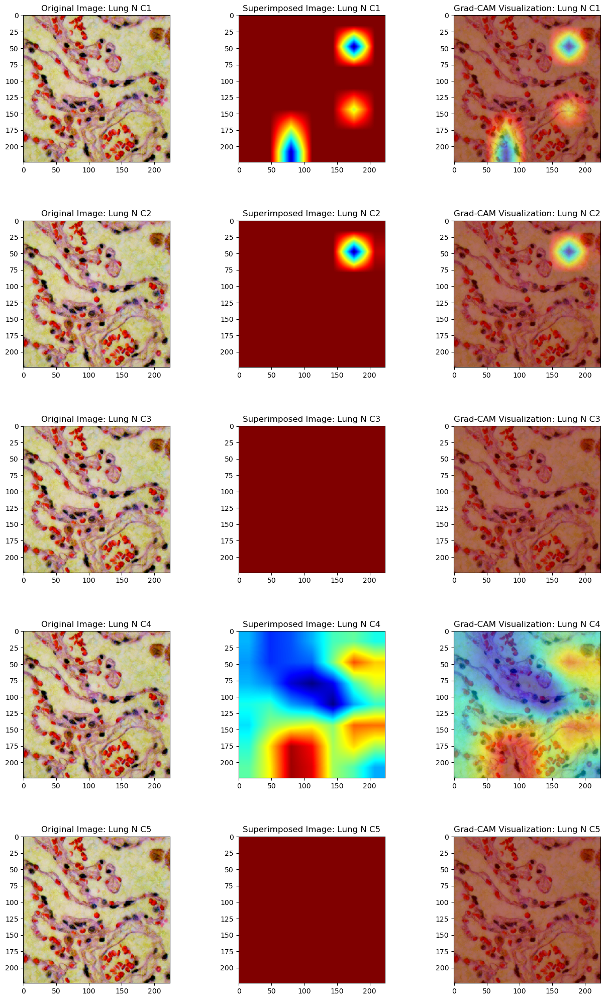

In [39]:
#Class 4:
input_image = X_train[5]

target_class_1 = np.array([1,0,0,0,0])
target_class_2 = np.array([0,1,0,0,0])
target_class_3 = np.array([0,0,1,0,0])
target_class_4 = np.array([0,0,0,1,0])
target_class_5 = np.array([0,0,0,0,1])

last_conv_layer_name = 'top_conv'

superimposed_img, heatmap = grad_cam(model, input_image, target_class_1, last_conv_layer_name)
superimposed_img2, heatmap2 = grad_cam(model, input_image, target_class_2, last_conv_layer_name)
superimposed_img3, heatmap3 = grad_cam(model, input_image, target_class_3, last_conv_layer_name)
superimposed_img4, heatmap4 = grad_cam(model, input_image, target_class_4, last_conv_layer_name)
superimposed_img5, heatmap5 = grad_cam(model, input_image, target_class_5, last_conv_layer_name)


fig, axes = plt.subplots(5,3,figsize=(15,25))

fig.subplots_adjust(hspace=0.4, wspace=0.4)

axes[0,0].imshow(input_image)
axes[0,0].set_title('Original Image: Lung N C1')

axes[0,1].imshow(heatmap)
axes[0,1].set_title('Superimposed Image: Lung N C1')

axes[0,2].imshow(input_image)
axes[0,2].imshow(heatmap, alpha=0.5, cmap='jet')
axes[0,2].set_title('Grad-CAM Visualization: Lung N C1')

axes[1,0].imshow(input_image)
axes[1,0].set_title('Original Image: Lung N C2')

axes[1,1].imshow(heatmap2)
axes[1,1].set_title('Superimposed Image: Lung N C2')

axes[1,2].imshow(input_image)
axes[1,2].imshow(heatmap2, alpha=0.5, cmap='jet')
axes[1,2].set_title('Grad-CAM Visualization: Lung N C2')

axes[2,0].imshow(input_image)
axes[2,0].set_title('Original Image: Lung N C3')

axes[2,1].imshow(heatmap3)
axes[2,1].set_title('Superimposed Image: Lung N C3')

axes[2,2].imshow(input_image)
axes[2,2].imshow(heatmap3, alpha=0.5, cmap='jet')
axes[2,2].set_title('Grad-CAM Visualization: Lung N C3')

axes[3,0].imshow(input_image)
axes[3,0].set_title('Original Image: Lung N C4')

axes[3,1].imshow(heatmap4)
axes[3,1].set_title('Superimposed Image: Lung N C4')

axes[3,2].imshow(input_image)
axes[3,2].imshow(heatmap4, alpha=0.5, cmap='jet')
axes[3,2].set_title('Grad-CAM Visualization: Lung N C4')

axes[4,0].imshow(input_image)
axes[4,0].set_title('Original Image: Lung N C5')

axes[4,1].imshow(heatmap5)
axes[4,1].set_title('Superimposed Image: Lung N C5')

axes[4,2].imshow(input_image)
axes[4,2].imshow(heatmap5, alpha=0.5, cmap='jet')
axes[4,2].set_title('Grad-CAM Visualization: Lung N C5')

plt.show()

## Colon ACA: Class 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

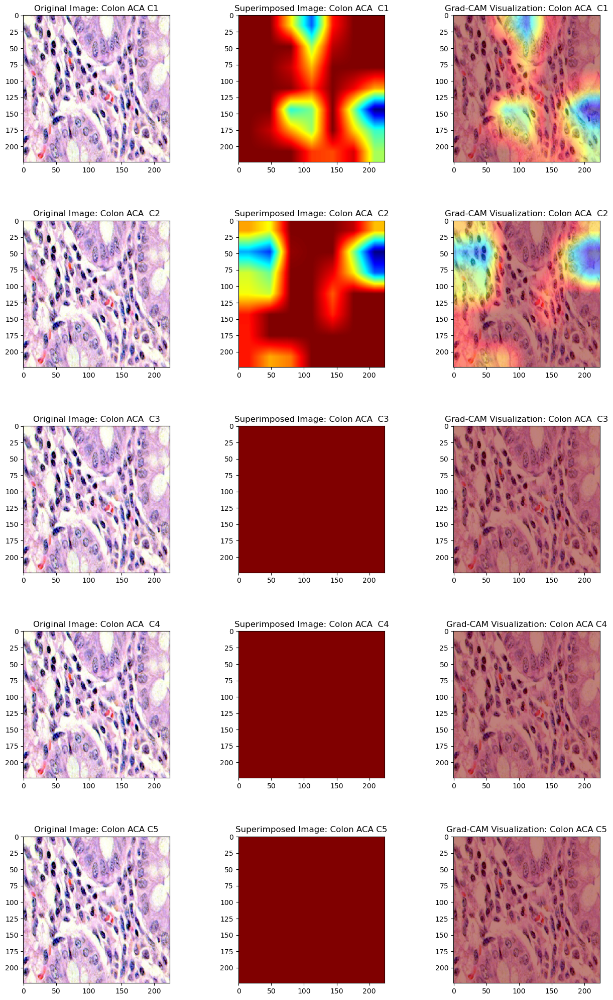

In [44]:
#Class 3:
input_image = X_train[7]

target_class_1 = np.array([1,0,0,0,0])
target_class_2 = np.array([0,1,0,0,0])
target_class_3 = np.array([0,0,1,0,0])
target_class_4 = np.array([0,0,0,1,0])
target_class_5 = np.array([0,0,0,0,1])

last_conv_layer_name = 'top_conv'

superimposed_img, heatmap = grad_cam(model, input_image, target_class_1, last_conv_layer_name)
superimposed_img2, heatmap2 = grad_cam(model, input_image, target_class_2, last_conv_layer_name)
superimposed_img3, heatmap3 = grad_cam(model, input_image, target_class_3, last_conv_layer_name)
superimposed_img4, heatmap4 = grad_cam(model, input_image, target_class_4, last_conv_layer_name)
superimposed_img5, heatmap5 = grad_cam(model, input_image, target_class_5, last_conv_layer_name)


fig, axes = plt.subplots(5,3,figsize=(15,25))

fig.subplots_adjust(hspace=0.4, wspace=0.4)

axes[0,0].imshow(input_image)
axes[0,0].set_title('Original Image: Colon ACA C1')

axes[0,1].imshow(heatmap)
axes[0,1].set_title('Superimposed Image: Colon ACA  C1')

axes[0,2].imshow(input_image)
axes[0,2].imshow(heatmap, alpha=0.5, cmap='jet')
axes[0,2].set_title('Grad-CAM Visualization: Colon ACA  C1')

axes[1,0].imshow(input_image)
axes[1,0].set_title('Original Image: Colon ACA  C2')

axes[1,1].imshow(heatmap2)
axes[1,1].set_title('Superimposed Image: Colon ACA  C2')

axes[1,2].imshow(input_image)
axes[1,2].imshow(heatmap2, alpha=0.5, cmap='jet')
axes[1,2].set_title('Grad-CAM Visualization: Colon ACA  C2')

axes[2,0].imshow(input_image)
axes[2,0].set_title('Original Image: Colon ACA  C3')

axes[2,1].imshow(heatmap3)
axes[2,1].set_title('Superimposed Image: Colon ACA  C3')

axes[2,2].imshow(input_image)
axes[2,2].imshow(heatmap3, alpha=0.5, cmap='jet')
axes[2,2].set_title('Grad-CAM Visualization: Colon ACA  C3')

axes[3,0].imshow(input_image)
axes[3,0].set_title('Original Image: Colon ACA  C4')

axes[3,1].imshow(heatmap4)
axes[3,1].set_title('Superimposed Image: Colon ACA  C4')

axes[3,2].imshow(input_image)
axes[3,2].imshow(heatmap4, alpha=0.5, cmap='jet')
axes[3,2].set_title('Grad-CAM Visualization: Colon ACA C4')

axes[4,0].imshow(input_image)
axes[4,0].set_title('Original Image: Colon ACA C5')

axes[4,1].imshow(heatmap5)
axes[4,1].set_title('Superimposed Image: Colon ACA C5')

axes[4,2].imshow(input_image)
axes[4,2].imshow(heatmap5, alpha=0.5, cmap='jet')
axes[4,2].set_title('Grad-CAM Visualization: Colon ACA C5')

plt.show()

In [116]:
#Extract output from last convolutional layer using EfficientNetB0 model
def get_conv_layer_output(model, image, last_conv_layer_name):
    image_array = np.expand_dims(image, axis=0)
    last_conv_layer = model.get_layer(last_conv_layer_name)
    iterate = tf.keras.models.Model([model.inputs], [last_conv_layer.output])
    last_conv_layer_output = iterate(image_array)
    return last_conv_layer_output.numpy()

last_conv_layer_name = 'flatten'
conv_layer_output = get_conv_layer_output(model,input_image,last_conv_layer_name)

In [117]:
#Extracting features from the last convolutional layer for each image
X_train_features = [get_conv_layer_output(model, x, last_conv_layer_name) for x in X_train]
X_val_features = [get_conv_layer_output(model, x, last_conv_layer_name) for x in X_val]
X_test_features = [get_conv_layer_output(model, x, last_conv_layer_name) for x in X_test]

all_features = np.concatenate([X_train_features, X_val_features, X_test_features], axis=0)

all_features_2d = all_features.reshape(all_features.shape[0], -1)

In [264]:
#Using PCA and UMAP to conduct feature reduction
#PCA
pca = PCA(n_components = 3)
pca_features = pca.fit_transform(all_features_2d)

#UMAP
n_neighbors = 8
min_dist = 0.001
umap_reducer = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=3)
umap_features = umap_reducer.fit_transform(all_features_2d)

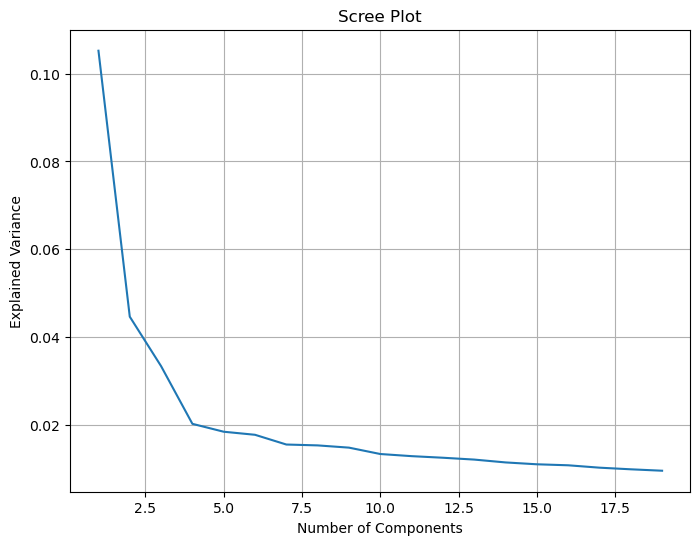

In [263]:
#Determining number of components - PCA
exp_var = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.plot(range(1, 20), exp_var[0:19]) #originally used len(exp_var) which equalled 200
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()

#Looks like after 3 theres a drop off

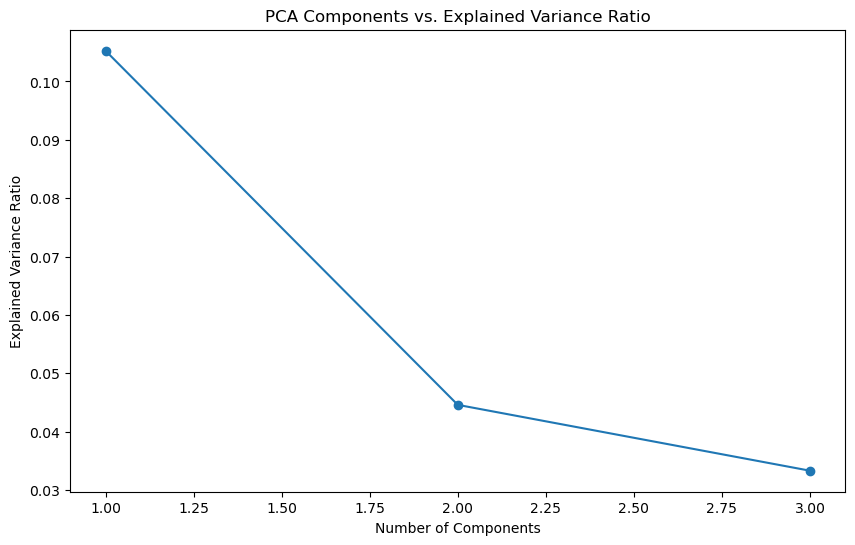

In [184]:
plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Explained Variance Ratio")
plt.title("PCA Components vs. Explained Variance Ratio")
plt.show()

In [265]:
n_clusters = 5

kmeans = KMeans(n_clusters=n_clusters)
kmeans_pca = kmeans.fit_predict(pca_features)
kmeans_umap = kmeans.fit_predict(umap_features)

gmm = GaussianMixture(n_components = n_clusters)
gmm_pca = gmm.fit_predict(pca_features)
gmm_umap = gmm.fit_predict(umap_features)

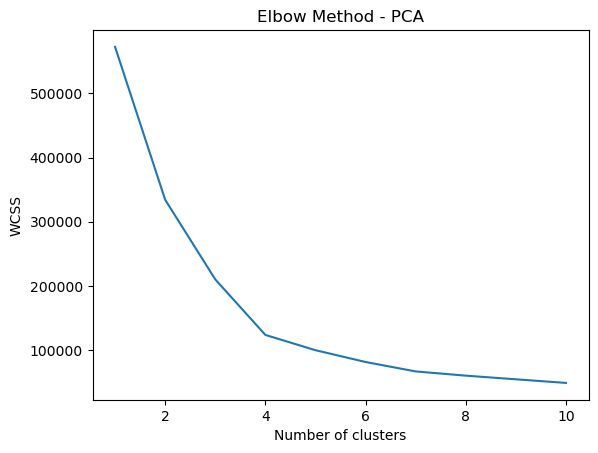

In [266]:
#Finding the best K for pca
wcss = []
max_clusters = 10

for i in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(pca_features) # or umap_features
    wcss.append(kmeans.inertia_)

plt.plot(range(1, max_clusters + 1), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method - PCA')
plt.show()

#Best cluster: 4

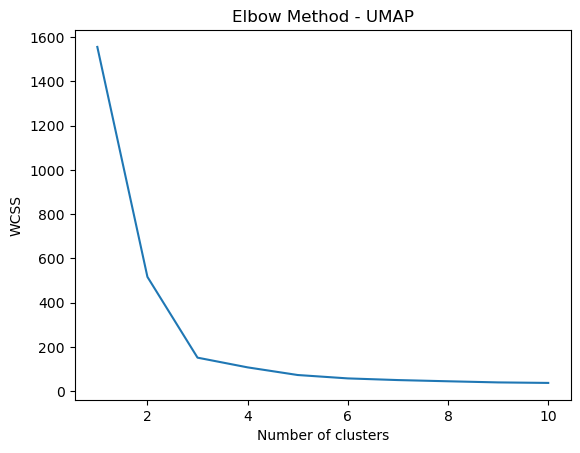

In [267]:
#Finding the best K for umap
wcss = []
max_clusters = 10

for i in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(umap_features) # or umap_features
    wcss.append(kmeans.inertia_)

plt.plot(range(1, max_clusters + 1), wcss)
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method - UMAP')
plt.show()

#Best cluster: 3

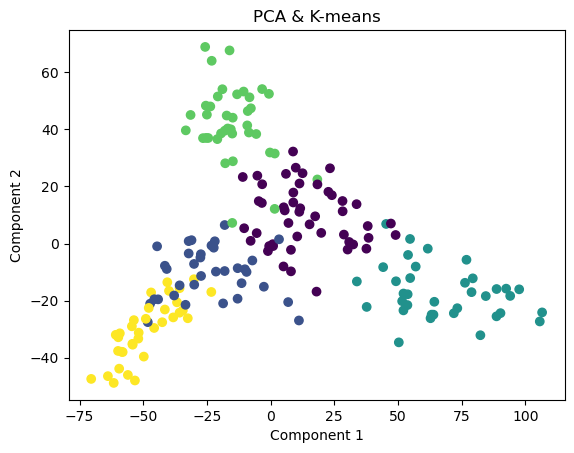

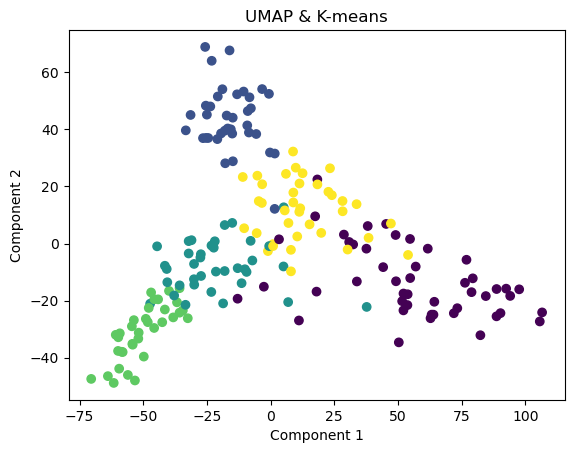

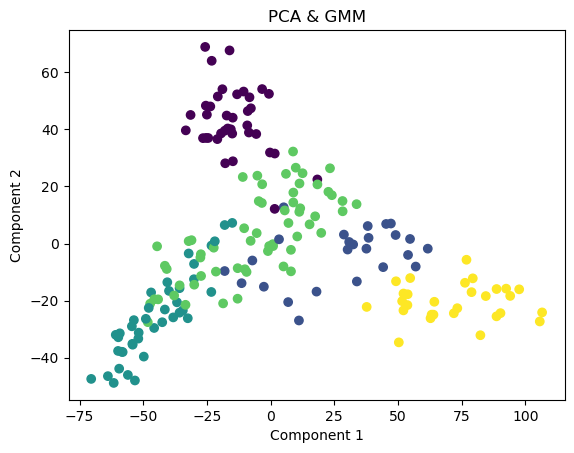

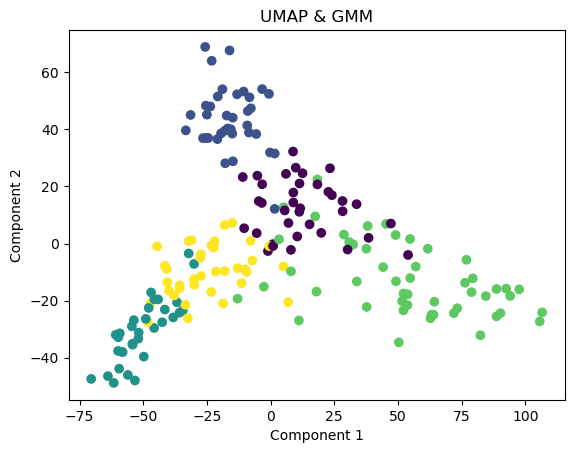

In [268]:
def plot_clustering(features, labels, title):
    plt.scatter(features[:,0], features[:,1], c=labels,cmap='viridis')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title(title)
    plt.show()

plot_clustering(pca_features, kmeans_pca, 'PCA & K-means')
plot_clustering(pca_features, kmeans_umap, 'UMAP & K-means')

plot_clustering(pca_features, gmm_pca, 'PCA & GMM')
plot_clustering(pca_features, gmm_umap, 'UMAP & GMM')

In [269]:
def cluster_acc(y_true, y_pred):
    y_true = y_true.astype(np.int64)
    assert y_pred.size == y_true.size
    D = max(y_pred.max(), y_true.max()) + 1
    w = np.zeros((D, D), dtype=np.int64)
    for i in range(y_pred.size):
        w[y_pred[i], y_true[i]] += 1
    from scipy.optimize import linear_sum_assignment
    row_ind, col_ind = linear_sum_assignment(w.max() - w)
    return sum(w[row_ind, col_ind]) * 1.0 / y_pred.size

In [270]:
# Get true labels
y_true_train = np.argmax(y_train, axis=1)
y_true_val = np.argmax(y_val, axis=1)
y_true_test = np.argmax(y_test, axis=1)
y_true_all = np.concatenate([y_true_train, y_true_val, y_true_test], axis=0)

# Calculate accuracy and confusion matrix for K-means and Gaussian Mixture Model with PCA and UMAP features
for method, labels_pred in [('K-means PCA', kmeans_pca), ('K-means UMAP', kmeans_umap), ('GMM PCA', gmm_pca), ('GMM UMAP', gmm_umap)]:
    accuracy = cluster_acc(y_true_all, labels_pred)
    print(f"{method} - Accuracy: {accuracy}")

K-means PCA - Accuracy: 0.8020833333333334
K-means UMAP - Accuracy: 0.7760416666666666
GMM PCA - Accuracy: 0.7239583333333334
GMM UMAP - Accuracy: 0.765625


In [271]:
from sklearn.metrics import silhouette_score

silhouette_avg1 = silhouette_score(umap_features, kmeans_umap)
silhouette_avg2 = silhouette_score(pca_features, kmeans_pca)
silhouette_avg3 = silhouette_score(umap_features, gmm_umap)
silhouette_avg4 = silhouette_score(pca_features, gmm_pca)
print("K-means UMAP - silhouette_score:", silhouette_avg1)
print("K-means PCA - silhouette_score:", silhouette_avg2)
print("GMM UMAP - silhouette_score:", silhouette_avg3)
print("GMM PCA - silhouette_score:", silhouette_avg4)

K-means UMAP - silhouette_score: 0.5178589
K-means PCA - silhouette_score: 0.44574562
GMM UMAP - silhouette_score: 0.50102705
GMM PCA - silhouette_score: 0.40277365
